In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import (train_test_split,KFold)
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
#import plotly.plotly as py
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_absolute_error
import lightgbm as lgb
#!pip install xgboost
import xgboost as xgb
import copy
%matplotlib inline

In [2]:
#Loading data :
train = pd.read_csv('train.csv', parse_dates=['date'])
test = pd.read_csv('test.csv', parse_dates=['date'])
sample = pd.read_csv('sample_submission.csv')
print('Train shape:{}, Test shape:{}'.format(train.shape, test.shape))
train.head()

Train shape:(913000, 4), Test shape:(45000, 4)


,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [3]:
test1 = copy.deepcopy(test)
train1 = copy.deepcopy(train)

In [4]:
sample.head()

,id,sales
0,0,52
1,1,52
2,2,52
3,3,52
4,4,52


In [5]:
print(test.shape)
test.head()

(45000, 4)


,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1


In [6]:
print(train.shape)
train.head()

(913000, 4)


,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [7]:
train['date']=pd.to_datetime(train['date'], infer_datetime_format=True)
test['date']=pd.to_datetime(test['date'], infer_datetime_format=True)
train['year'] = train['date'].dt.year
train['month'] = train['date'].dt.month
train['day'] = train['date'].dt.day
train['week'] = train['date'].dt.week
train['weekofyear'] = train['date'].dt.weekofyear
train['dayofweek'] = train['date'].dt.dayofweek
train['weekday'] = train['date'].dt.weekday
train['dayofyear'] = train['date'].dt.dayofyear
train['quarter'] = train['date'].dt.quarter
train['is_month_start'] = train['date'].dt.is_month_start
train['is_month_end'] =train['date'].dt.is_month_end
train['is_quarter_start'] = train['date'].dt.is_quarter_start
train['is_quarter_end'] = train['date'].dt.is_quarter_end
train['is_year_start'] = train['date'].dt.is_year_start
train['is_year_end'] = train['date'].dt.is_year_end
train['daily_avg']=train.groupby(['item','store','dayofweek'])['sales'].transform('mean')
train['monthly_avg']=train.groupby(['item','store','month'])['sales'].transform('mean')
train["mean_store_item_month"] = train.groupby(['month',"item","store"])["sales"].transform("mean")
train["item_month_sum"] = train.groupby(['month',"item"])["sales"].transform("sum") # total sales of that item  for all stores
train["store_month_sum"] = train.groupby(['month',"store"])["sales"].transform("sum") # total sales of that store  for all items
#train['store_item_shifted_365'] = train.groupby(["item","store"])['sales'].transform(lambda x:x.shift(365)) # sales for that 1 year  ago
#train["item-week_shifted_90"] = train.groupby(['weekofyear',"item"])["sales"].transform(lambda x:x.shift(12).sum()) # shifted total sales for that item 12 weeks (3 months) ago
#train['store_item_shifted_365'].fillna(train['store_item_shifted_365'].mode()[0], inplace=True)
daily_avg=train.groupby(['item','store','dayofweek'])['sales'].mean().reset_index()
monthly_avg=train.groupby(['item','store','month'])['sales'].mean().reset_index()
mean_store_item_month = train.groupby(['month','item','store'])['sales'].mean().reset_index()
item_month_sum=train.groupby(['month','item'])['sales'].sum().reset_index()
store_month_sum=train.groupby(['month','store'])['sales'].sum().reset_index()
#store_item_shifted_365=train.groupby(['item','store'])['sales'].shift(365).reset_index
#item_week_shifted_90=train.groupby(['weekofyear','item','dayofweek'])['sales'].shift(12).reset_index()
train.dtypes

<ipython-input-7-e795590c4741>:6: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.

<ipython-input-7-e795590c4741>:7: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



date                     datetime64[ns]
store                             int64
item                              int64
sales                             int64
year                              int64
month                             int64
day                               int64
week                              int64
weekofyear                        int64
dayofweek                         int64
weekday                           int64
dayofyear                         int64
quarter                           int64
is_month_start                     bool
is_month_end                       bool
is_quarter_start                   bool
is_quarter_end                     bool
is_year_start                      bool
is_year_end                        bool
daily_avg                       float64
monthly_avg                     float64
mean_store_item_month           float64
item_month_sum                    int64
store_month_sum                   int64
dtype: object

In [8]:
#Create mask for boolean values for train dataset
train['is_month_start'] = train['is_month_start'].replace({True: 1, False: 0})
train['is_month_end'] = train['is_month_end'].replace({True: 1, False: 0})
train['is_quarter_start'] = train['is_quarter_start'].replace({True: 1, False: 0})
train['is_quarter_end'] = train['is_quarter_end'].replace({True: 1, False: 0})
train['is_year_start'] = train['is_year_start'].replace({True: 1, False: 0})
train['is_year_end'] = train['is_year_end'].replace({True: 1, False: 0})

#convert float to int
train['daily_avg']=train['daily_avg'].astype(np.int64)
train['monthly_avg']=train['monthly_avg'].astype(np.int64)
train['mean_store_item_month']=train['mean_store_item_month'].astype(np.int64)
#train['store_item_shifted_365']=train['store_item_shifted_365'].astype(np.int64)
train.dtypes

date                     datetime64[ns]
store                             int64
item                              int64
sales                             int64
year                              int64
month                             int64
day                               int64
week                              int64
weekofyear                        int64
dayofweek                         int64
weekday                           int64
dayofyear                         int64
quarter                           int64
is_month_start                    int64
is_month_end                      int64
is_quarter_start                  int64
is_quarter_end                    int64
is_year_start                     int64
is_year_end                       int64
daily_avg                         int64
monthly_avg                       int64
mean_store_item_month             int64
item_month_sum                    int64
store_month_sum                   int64
dtype: object

In [9]:
train.head()

,date,store,item,sales,year,month,day,week,weekofyear,dayofweek,...,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,daily_avg,monthly_avg,mean_store_item_month,item_month_sum,store_month_sum
0,2013-01-01,1,1,13,2013,1,1,1,1,1,...,0,1,0,1,0,18,13,13,22987,249352
1,2013-01-02,1,1,11,2013,1,2,1,1,2,...,0,0,0,0,0,18,13,13,22987,249352
2,2013-01-03,1,1,14,2013,1,3,1,1,3,...,0,0,0,0,0,19,13,13,22987,249352
3,2013-01-04,1,1,13,2013,1,4,1,1,4,...,0,0,0,0,0,21,13,13,22987,249352
4,2013-01-05,1,1,10,2013,1,5,1,1,5,...,0,0,0,0,0,22,13,13,22987,249352


In [10]:
test['year'] = test['date'].dt.year
test['month'] = test['date'].dt.month
test['day'] = test['date'].dt.day
test['week'] = test['date'].dt.week
test['weekofyear'] = test['date'].dt.weekofyear
test['dayofweek'] = test['date'].dt.dayofweek
test['weekday'] = test['date'].dt.weekday
test['dayofyear'] = test['date'].dt.dayofyear
test['quarter'] = test['date'].dt.quarter
test['is_month_start'] = test['date'].dt.is_month_start
test['is_month_end']= test['date'].dt.is_month_end
test['is_quarter_start'] = test['date'].dt.is_quarter_start
test['is_quarter_end'] = test['date'].dt.is_quarter_end
test['is_year_start'] = test['date'].dt.is_year_start
test['is_year_end'] = test['date'].dt.is_year_end
test.dtypes

<ipython-input-10-eaae50ded542>:4: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.

<ipython-input-10-eaae50ded542>:5: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



id                           int64
date                datetime64[ns]
store                        int64
item                         int64
year                         int64
month                        int64
day                          int64
week                         int64
weekofyear                   int64
dayofweek                    int64
weekday                      int64
dayofyear                    int64
quarter                      int64
is_month_start                bool
is_month_end                  bool
is_quarter_start              bool
is_quarter_end                bool
is_year_start                 bool
is_year_end                   bool
dtype: object

In [11]:
#Create mask for boolean values for test dataset
test['is_month_start'] = test['is_month_start'].replace({True: 1, False: 0})
test['is_month_end'] = test['is_month_end'].replace({True: 1, False: 0})
test['is_quarter_start'] = test['is_quarter_start'].replace({True: 1, False: 0})
test['is_quarter_end'] = test['is_quarter_end'].replace({True: 1, False: 0})
test['is_year_start'] = test['is_year_start'].replace({True: 1, False: 0})
test['is_year_end'] = test['is_year_end'].replace({True: 1, False: 0})
test['is_year_end'] = test['is_year_end'].astype(str).astype(np.int64)

#Add sales column with merge/join function to test data
def merge(x,y,col,col_name):
    x =pd.merge(x, y, how='left', on=None, left_on=col, right_on=col,
            left_index=False, right_index=False, sort=True,
             copy=True, indicator=False,validate=None)
    
    x=x.rename(columns={'sales':col_name})
    return x

test=merge(test, daily_avg,['item','store','dayofweek'],'daily_avg')
test=merge(test, monthly_avg,['item','store','month'],'monthly_avg')
test=merge(test, mean_store_item_month, ['month','item','store'],'mean_store_item_month')
test=merge(test, item_month_sum,['month','item'],'item_month_sum')
test=merge(test, store_month_sum,['month','store'],'store_month_sum')
#test=merge(test, store_item_shifted_365,['item','store'],'store_item_shifted_365')
#test=merge(test, item_week_shifted_90,['weekofyear', 'item'],'item-week_shifted_90')

#convert float to int
test['daily_avg']=test['daily_avg'].astype(np.int64)
test['monthly_avg']=test['monthly_avg'].astype(np.int64)
test['mean_store_item_month']=test['mean_store_item_month'].astype(np.int64)
#test['store_item_shifted_365']=test['store_item_shifted_365'].astype(np.int64)
test.dtypes

id                                int64
date                     datetime64[ns]
store                             int64
item                              int64
year                              int64
month                             int64
day                               int64
week                              int64
weekofyear                        int64
dayofweek                         int64
weekday                           int64
dayofyear                         int64
quarter                           int64
is_month_start                    int64
is_month_end                      int64
is_quarter_start                  int64
is_quarter_end                    int64
is_year_start                     int64
is_year_end                       int64
daily_avg                         int64
monthly_avg                       int64
mean_store_item_month             int64
item_month_sum                    int64
store_month_sum                   int64
dtype: object

In [12]:
test.head()

,id,date,store,item,year,month,day,week,weekofyear,dayofweek,...,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,daily_avg,monthly_avg,mean_store_item_month,item_month_sum,store_month_sum
0,0,2018-01-01,1,1,2018,1,1,1,1,0,...,0,1,0,1,0,15,13,13,22987,249352
1,7,2018-01-08,1,1,2018,1,8,2,2,0,...,0,0,0,0,0,15,13,13,22987,249352
2,14,2018-01-15,1,1,2018,1,15,3,3,0,...,0,0,0,0,0,15,13,13,22987,249352
3,21,2018-01-22,1,1,2018,1,22,4,4,0,...,0,0,0,0,0,15,13,13,22987,249352
4,28,2018-01-29,1,1,2018,1,29,5,5,0,...,0,0,0,0,0,15,13,13,22987,249352


In [13]:
# As we can see there are no missing values.
train_NA = train.isna()
train_num_NA = train_NA.sum()
train_num_NA

date                     0
store                    0
item                     0
sales                    0
year                     0
month                    0
day                      0
week                     0
weekofyear               0
dayofweek                0
weekday                  0
dayofyear                0
quarter                  0
is_month_start           0
is_month_end             0
is_quarter_start         0
is_quarter_end           0
is_year_start            0
is_year_end              0
daily_avg                0
monthly_avg              0
mean_store_item_month    0
item_month_sum           0
store_month_sum          0
dtype: int64

In [14]:
print('Min date from train set: %s' % train['date'].min().date())
print('Max date from train set: %s' % train['date'].max().date())

Min date from train set: 2013-01-01
Max date from train set: 2017-12-31


In [15]:
lag_size = (test['date'].max().date() - train['date'].max().date()).days
print('Max date from train set: %s' % train['date'].max().date())
print('Max date from test set: %s' % test['date'].max().date())
print('Forecast lag size', lag_size)

Max date from train set: 2017-12-31
Max date from test set: 2018-03-31
Forecast lag size 90


Skew Dist: 0.8671122960235805
Kurtosis Dist: 0.5090704757198172
We can see that our data is skewed to the right


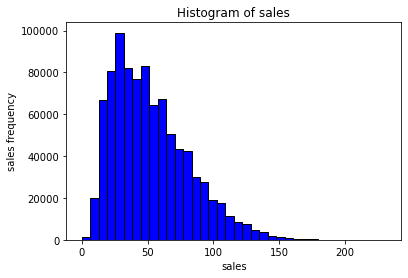

In [16]:
plt.hist(train['sales'], color = 'blue', edgecolor = 'black',
         bins = int(180/5))


plt.title('Histogram of sales')
plt.xlabel('sales')
plt.ylabel('sales frequency')

print('Skew Dist:',train['sales'].skew())
print('Kurtosis Dist:',train['sales'].kurt())
print("We can see that our data is skewed to the right")

Skew Dist: -0.375579598747413
Kurtosis Dist: -0.2389747199181107


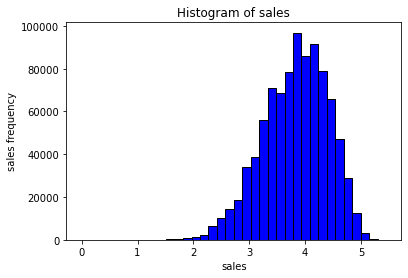

In [17]:
#Take log of sales to reduce skewness
train['sales'] = np.log1p(train.sales)


plt.hist(train['sales'], color = 'blue', edgecolor = 'black',
         bins = int(180/5))

plt.title('Histogram of sales')
plt.xlabel('sales')
plt.ylabel('sales frequency')

print('Skew Dist:',train['sales'].skew())
print('Kurtosis Dist:',train['sales'].kurt())

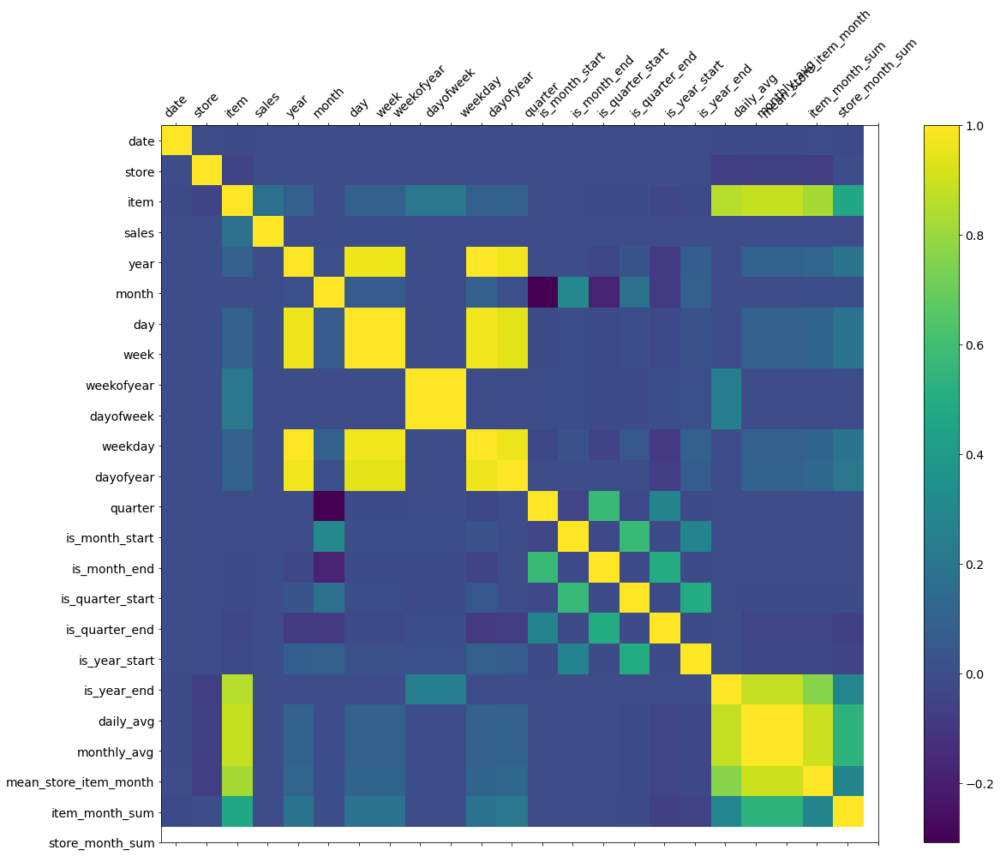

In [18]:
f = plt.figure(figsize=(19, 15))
plt.matshow(train.corr(), fignum=f.number)
plt.xticks(range(train.shape[1]), train.columns, fontsize=14, rotation=45)
plt.yticks(range(train.shape[1]), train.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

In [19]:
import plotly.offline as pyo
pyo.init_notebook_mode()
daily_sales = train.groupby('date', as_index=False)['sales'].sum()
store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()
item_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()
daily_sales_sc = go.Scatter(x=daily_sales['date'], y=daily_sales['sales'])
layout = go.Layout(title='Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

In [20]:
store_daily_sales_sc = []
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['date'], y=current_store_daily_sales['sales'], name=('Store %s' % store)))

layout = go.Layout(title='Store daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

In [21]:
item_daily_sales_sc = []
for item in item_daily_sales['item'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['item'] == item)]
    item_daily_sales_sc.append(go.Scatter(x=current_item_daily_sales['date'], y=current_item_daily_sales['sales'], name=('Item %s' % item)))

layout = go.Layout(title='Item daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

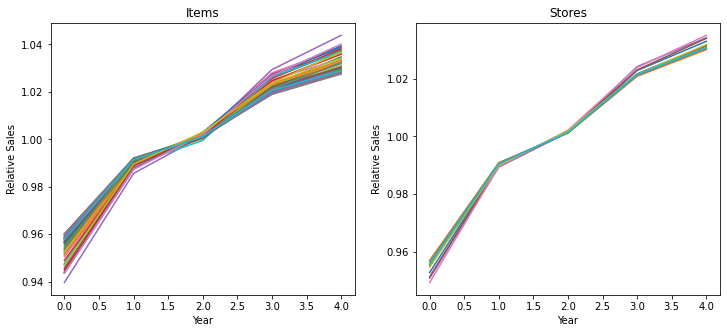

All items and stores seem to enjoy a similar growth in sales over the years.


In [22]:
agg_year_item = pd.pivot_table(train, index='year', columns='item',
                               values='sales', aggfunc=np.mean).values
agg_year_store = pd.pivot_table(train, index='year', columns='store',
                                values='sales', aggfunc=np.mean).values

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(agg_year_item / agg_year_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Year")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_year_store / agg_year_store.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Year")
plt.ylabel("Relative Sales")
plt.show()
print("All items and stores seem to enjoy a similar growth in sales over the years.")

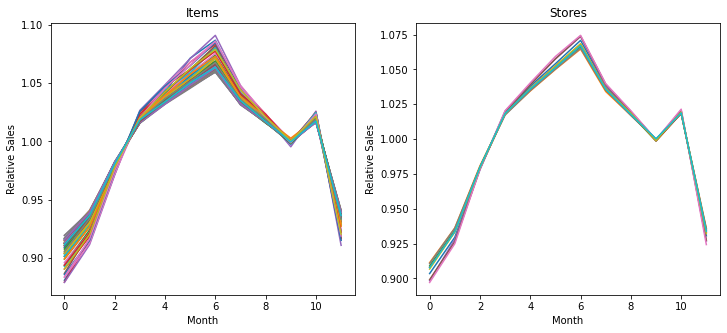

All items and stores seem to share a common pattern in sales over the months as well.


In [23]:
agg_month_item = pd.pivot_table(train, index='month', columns='item',
                                values='sales', aggfunc=np.mean).values
agg_month_store = pd.pivot_table(train, index='month', columns='store',
                                 values='sales', aggfunc=np.mean).values

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(agg_month_item / agg_month_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Month")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_month_store / agg_month_store.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Month")
plt.ylabel("Relative Sales")
plt.show()
print("All items and stores seem to share a common pattern in sales over the months as well.")

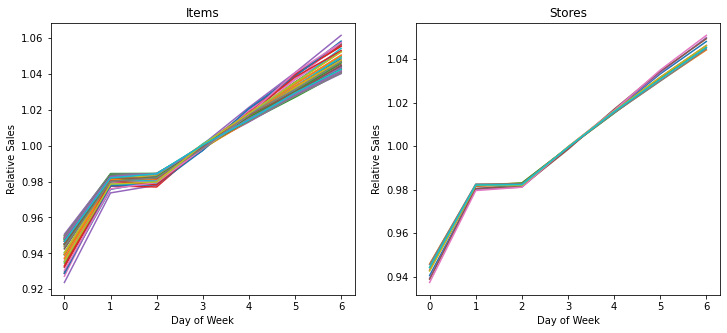

All items and stores also seem to share a common pattern in sales over the days of the week as well.


In [24]:
agg_dow_item = pd.pivot_table(train, index='dayofweek', columns='item',
                              values='sales', aggfunc=np.mean).values
agg_dow_store = pd.pivot_table(train, index='dayofweek', columns='store',
                               values='sales', aggfunc=np.mean).values

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(agg_dow_item / agg_dow_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_dow_store / agg_dow_store.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.show()
print("All items and stores also seem to share a common pattern in sales over the days of the week as well.")

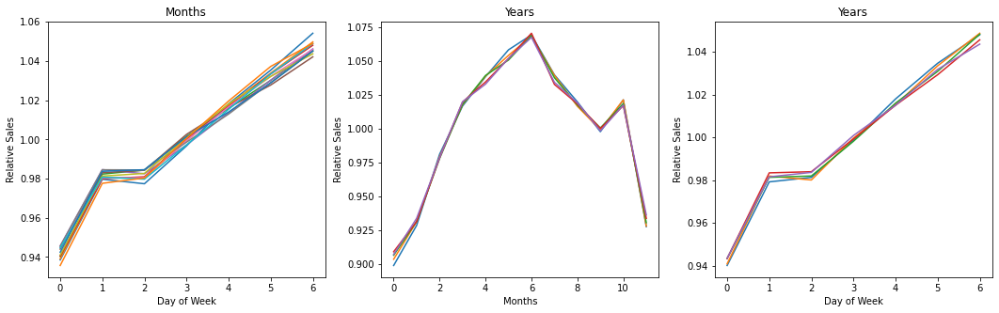

Not checking for degeneracies in the data can lead to missing important trends in complex datasets. For example, when looking at the monthly patterns, we average over all days of the month, years and either items or stores. But what if sales have a multi-dimensional dependence on two of these parameters that isn't easily separable? So, always check for degeneracies in the data!


In [25]:
agg_dow_month = pd.pivot_table(train, index='dayofweek', columns='month',
                               values='sales', aggfunc=np.mean).values
agg_month_year = pd.pivot_table(train, index='month', columns='year',
                                values='sales', aggfunc=np.mean).values
agg_dow_year = pd.pivot_table(train, index='dayofweek', columns='year',
                              values='sales', aggfunc=np.mean).values

plt.figure(figsize=(18, 5))
plt.subplot(131)
plt.plot(agg_dow_month / agg_dow_month.mean(0)[np.newaxis])
plt.title("Months")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.subplot(132)
plt.plot(agg_month_year / agg_month_year.mean(0)[np.newaxis])
plt.title("Years")
plt.xlabel("Months")
plt.ylabel("Relative Sales")
plt.subplot(133)
plt.plot(agg_dow_year / agg_dow_year.mean(0)[np.newaxis])
plt.title("Years")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.show()
print("Not checking for degeneracies in the data can lead to \
missing important trends in complex datasets. For example, when looking at the monthly \
patterns, we average over all days of the month, years and either items or stores. But \
what if sales have a multi-dimensional dependence on two of these parameters that isn't \
easily separable? So, always check for degeneracies in the data!")

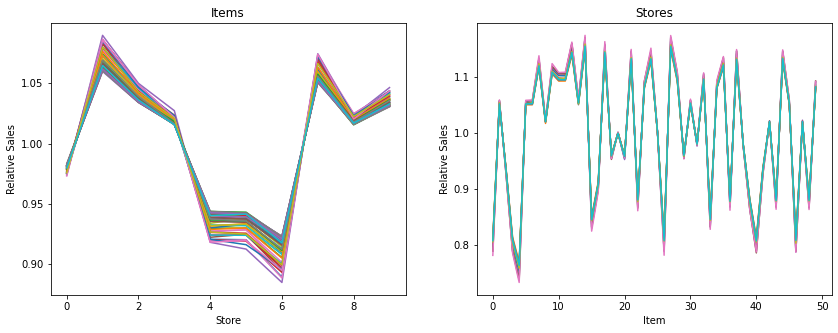

Same here. Just a constant pattern and no degeneracies. So, you just need a model for how items sell at different stores, which is easily captured by an average sales look-up table or yet another relative sales pattern model.


In [26]:
agg_store_item = pd.pivot_table(train, index='store', columns='item',
                                values='sales', aggfunc=np.mean).values

plt.figure(figsize=(14, 5))
plt.subplot(121)
plt.plot(agg_store_item / agg_store_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Store")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_store_item.T / agg_store_item.T.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Item")
plt.ylabel("Relative Sales")
plt.show()
print("Same here. Just a constant pattern and no degeneracies. \
So, you just need a model for how items sell at different stores, \
which is easily captured by an average sales look-up table or \
yet another ""relative sales"" pattern model.")

* #### XGBoost


In [16]:
test= test.drop(['date','id'], axis = 1)
train= train.drop(['date'], axis = 1)

In [17]:
train_size = int(len(train) * 0.66)
train_n, test_n = train[0:train_size], train[train_size:len(train)]
print('Observations: %d' % (len(train)))
print('Training Observations: %d' % (len(train_n)))
print('Testing Observations: %d' % (len(test_n)))

train_n = pd.DataFrame(train_n)
test_n = pd.DataFrame(test_n)

x_train = train_n.drop('sales', axis=1)
y_train = train_n.pop('sales')
x_test = test_n.drop('sales', axis=1)
y_test = test_n.pop('sales')


x_train,x_test,y_train,y_test = train_test_split(train.drop('sales',axis=1),train.pop('sales'),random_state=42,test_size=0.2)

Observations: 913000
Training Observations: 602580
Testing Observations: 310420


In [18]:
#change added here - earlier, objective reg:linear
def XGBmodel(x_train,x_test,y_train,y_test):
    matrix_train = xgb.DMatrix(x_train,label=y_train)
    matrix_test = xgb.DMatrix(x_test,label=y_test)
    model=xgb.train(params={'objective':'reg:squarederror','eval_metric':'mae'}
                  ,dtrain=matrix_train,num_boost_round=500, 
                    early_stopping_rounds=20,evals=[(matrix_test,'test')],)
    return model

model=XGBmodel(x_train,x_test,y_train,y_test)

[0]	test-mae:36.25439
[1]	test-mae:25.39241
[2]	test-mae:17.84686
[3]	test-mae:12.76558
[4]	test-mae:9.55350
[5]	test-mae:7.67656
[6]	test-mae:6.65247
[7]	test-mae:6.12072
[8]	test-mae:5.85447
[9]	test-mae:5.72125
[10]	test-mae:5.65608
[11]	test-mae:5.62412
[12]	test-mae:5.60808
[13]	test-mae:5.59832
[14]	test-mae:5.59416
[15]	test-mae:5.59151
[16]	test-mae:5.58916
[17]	test-mae:5.58843
[18]	test-mae:5.58788
[19]	test-mae:5.58644
[20]	test-mae:5.58611
[21]	test-mae:5.58540
[22]	test-mae:5.58517
[23]	test-mae:5.58493
[24]	test-mae:5.58471
[25]	test-mae:5.58422
[26]	test-mae:5.58405
[27]	test-mae:5.58394
[28]	test-mae:5.58417
[29]	test-mae:5.58379
[30]	test-mae:5.58322
[31]	test-mae:5.58319
[32]	test-mae:5.58318
[33]	test-mae:5.58264
[34]	test-mae:5.58247
[35]	test-mae:5.58212
[36]	test-mae:5.58202
[37]	test-mae:5.58118
[38]	test-mae:5.58011
[39]	test-mae:5.57989
[40]	test-mae:5.57989
[41]	test-mae:5.57967
[42]	test-mae:5.57924
[43]	test-mae:5.57897
[44]	test-mae:5.57880
[45]	test-mae:5.

In [19]:
submission = pd.DataFrame()
y_pred = model.predict(xgb.DMatrix(test), ntree_limit = model.best_ntree_limit)

submission['sales']= y_pred

submission['id'] = submission.index
columns_titles = ["id","sales"]
submission=submission.reindex(columns=columns_titles)


submission.to_csv('submission.csv',index=False)

C:\Users\chinchu\anaconda3\lib\site-packages\xgboost\core.py:105: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



In [20]:
submission.head()

,id,sales
0,0,12.439528
1,1,12.544204
2,2,12.432760
3,3,11.819304
4,4,11.982799


#### End of file reached!!!!